# PACE Ocean Productivity and Algal Bloom Detection
**NASA PACE (Plankton, Aerosol, Cloud, ocean Ecosystem) Satellite Analysis**

## Project Overview

This notebook uses NASA PACE satellite data to analyze global ocean productivity. We download and explore real chlorophyll-a (Chl-a) measurements from the PACE OCI sensor, create global and regional maps, run basic statistical analysis, compare it with other algae products, and study the temporal dynamics of the algae.

### Scientific Background
Chlorophyll-a (Chl-a) is the primary photosynthetic pigment in phytoplankton. Its concentration (mg/m³) is a proxy for:
- **Ocean productivity** - higher Chl-a -> more phytoplankton -> more carbon fixation
- **Algal blooms** - localized, anomalously high Chl-a concentrations
- **Ecosystem health** - seasonal patterns, upwelling zones, nutrient availability

PACE's OCI instrument provides hyperspectral ocean color measurements, giving unprecedented Chl-a retrieval accuracy.

---
*Data source: NASA Earthdata - PACE_OCI_L3M_CHL_NRT (Level-3 Mapped, Near Real-Time)*

In [ ]:
!pip install earthaccess xarray netCDF4 h5netcdf matplotlib cartopy scikit-learn scipy seaborn --quiet
 #Installing necessary packages

print("All packages installed successfully.")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.1/77.1 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 45.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 82.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.9/203.9 kB 14.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 59.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.5/89.5 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.0/15.0 MB 68.4 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2025.3.0 requires fsspec==2025.3.0, but you have fsspec 2026.6.0 which is incompatible.
datasets 4.0.0 requires fsspec[http]<=2025.3.0,>=2023.1.0, but you have fsspec 2026.6.0 which is incompatible.
All packages installed successfully.


In [ ]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.gridspec as gridspec
from matplotlib.colors import LogNorm, BoundaryNorm
import seaborn as sns
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from sklearn.cluster import KMeans, DBSCAN
from sklearn.preprocessing import StandardScaler
from scipy import stats
import earthaccess
import warnings
warnings.filterwarnings('ignore')

plt.rcParams.update({
    'figure.dpi': 120,
    'savefig.dpi': 150,
    'font.family': 'DejaVu Sans',
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
})

print("All libraries imported successfully.")


All libraries imported successfully.


# **Downloading Data from NASA Earthdata**

In [ ]:
# Authenticate with NASA Earthdata
earthaccess.login(persist=True)
print("Logged in to NASA Earthdata.")


Enter your Earthdata Login username: shruuug
Enter your Earthdata password: ··········
Logged in to NASA Earthdata.


In [ ]:
# Search for the most recent PACE OCI Level-3 chlorophyll-a file
results = earthaccess.search_data(
    short_name="PACE_OCI_L3M_CHL",
    temporal=("2025-03-01", "2025-03-31"),  # pick any past month
    count=1
)

print(f"Found {len(results)} granule(s).")
print(f"Granule: {results[0]['umm']['GranuleUR']}")

Found 1 granule(s).
Granule: PACE_OCI_L3M_CHL_PACE_OCI.20241221_20250320.L3m.SNWI.CHL.V3_1.chlor_a.0p1deg.nc_3.1


In [ ]:
# Download the granule to a local folder
files = earthaccess.download(results, "./pace_data")
print(f"\nDownloaded: {files[0]}")


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]


Downloaded: pace_data/PACE_OCI.20241221_20250320.L3m.SNWI.CHL.V3_1.chlor_a.0p1deg.nc


# **Load & Explore PACE Dataset**

In [ ]:
# Open the dataset
ds = xr.open_dataset(files[0])

print("=" * 60)
print("DATASET SUMMARY")
print("=" * 60)
print(ds)
print("\nVariables  :", list(ds.data_vars))
print("Dimensions :", dict(ds.dims))
print("Coordinates:", list(ds.coords))


DATASET SUMMARY
<xarray.Dataset> Size: 26MB
Dimensions:  (lat: 1800, lon: 3600, rgb: 3, eightbitcolor: 256)
Coordinates:
  * lat      (lat) float32 7kB 89.95 89.85 89.75 89.65 ... -89.75 -89.85 -89.95
  * lon      (lon) float32 14kB -179.9 -179.9 -179.8 ... 179.8 179.9 180.0
Dimensions without coordinates: rgb, eightbitcolor
Data variables:
    chlor_a  (lat, lon) float32 26MB ...
    palette  (rgb, eightbitcolor) uint8 768B ...
Attributes: (12/64)
    product_name:                      PACE_OCI.20241221_20250320.L3m.SNWI.CH...
    instrument:                        OCI
    title:                             OCI Level-3 Standard Mapped Image
    project:                           Ocean Biology Processing Group (NASA/G...
    platform:                          PACE
    source:                            satellite observations from OCI-PACE
    ...                                ...
    identifier_product_doi:            10.5067/PACE/OCI/L3M/CHL/3.1
    keywords:                         

In [ ]:
# Extract chlorophyll-a and squeeze singleton dimensions
chl = ds["chlor_a"].squeeze()   # shape: (lat, lon)

# Identify dimension names (handle 'lat'/'latitude', 'lon'/'longitude')
lat_dim = [d for d in chl.dims if "lat" in d][0]
lon_dim = [d for d in chl.dims if "lon" in d][0]

# Flatten valid (ocean/non-masked) pixels
chl_vals = chl.values.flatten()
chl_vals = chl_vals[~np.isnan(chl_vals)] # filters out all NaN

print("=" * 60)
print("CHLOROPHYLL-A BASIC STATISTICS  (mg/m³)")
print("=" * 60)
print(f"  Grid shape   : {chl.shape}")
print(f"  Valid pixels : {len(chl_vals):,}  ({100*len(chl_vals)/chl.size:.1f}% ocean coverage)")
print(f"  Min          : {chl_vals.min():.4f} mg/m³")
print(f"  Max          : {chl_vals.max():.2f}  mg/m³")
print(f"  Mean         : {chl_vals.mean():.4f} mg/m³")
print(f"  Median       : {np.median(chl_vals):.4f} mg/m³")
print(f"  Std Dev      : {chl_vals.std():.4f} mg/m³")
print(f"  95th pct     : {np.percentile(chl_vals, 95):.4f} mg/m³")
print(f"  99th pct     : {np.percentile(chl_vals, 99):.2f}  mg/m³")

# Bloom threshold = 95th percentile (used throughout the notebook)
BLOOM_THRESH = np.percentile(chl_vals, 95)
print(f"\nBloom threshold (95th pct): {BLOOM_THRESH:.4f} mg/m³")


CHLOROPHYLL-A BASIC STATISTICS  (mg/m³)
  Grid shape   : (1800, 3600)
  Valid pixels : 3,621,276  (55.9% ocean coverage)
  Min          : 0.0010 mg/m³
  Max          : 99.26  mg/m³
  Mean         : 0.3167 mg/m³
  Median       : 0.1517 mg/m³
  Std Dev      : 1.1153 mg/m³
  95th pct     : 0.8010 mg/m³
  99th pct     : 3.69  mg/m³

Bloom threshold (95th pct): 0.8010 mg/m³


# **Full Global Map for PACE (Robinson Projection)**
A log-scaled global chlorophyll map. Log scaling is essential because Chlorophyll-a spans three orders of magnitude (0.01–20 mg/m³); a linear scale would wash out the dynamic range in low-productivity regions.

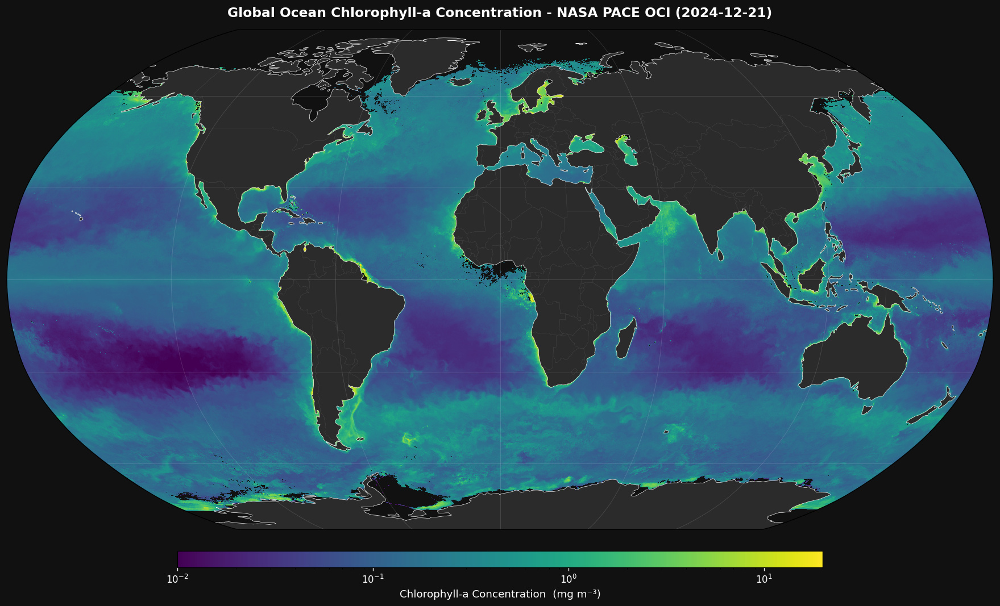

Saved -> figure1_global_chl.png


In [ ]:
def make_global_map(chl, title, cmap="viridis", vmin=0.01, vmax=20, figsize=(18, 9)):
    # Extract the longitude and latitude coordinate arrays from the xarray DataArray
    lons = chl[lon_dim].values
    lats = chl[lat_dim].values

    # Create a blank figure with the given size (width=18, height=9)
    fig = plt.figure(figsize=figsize)

    # Add a map subplot using the Robinson projection,  represents the entire globe with minimal distortion
    ax  = fig.add_subplot(1, 1, 1, projection=ccrs.Robinson())
    ax.set_global() # Zoom out to show the entire globe
    ax.add_feature(cfeature.LAND,      facecolor="#2b2b2b", zorder=1)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.4, edgecolor="white", zorder=2)
    ax.add_feature(cfeature.BORDERS,   linewidth=0.2, edgecolor="#555555", zorder=2)
    ax.gridlines(color="white", alpha=0.15, linewidth=0.5)

    # Plot the chlorophyll data as a colored grid on the map
    im = ax.pcolormesh(
        lons, lats, chl.values,
        norm=LogNorm(vmin=vmin, vmax=vmax), # use a log scale so low values (0.01) and high values (20) are both visible
        cmap=cmap,
        transform=ccrs.PlateCarree(), # tells Cartopy the data is in regular lat/lon coordinates
        shading="auto",
        zorder=0
    )

    # Add a horizontal colorbar below the map showing what colors mean
    cbar = plt.colorbar(im, ax=ax, orientation="horizontal",
                        pad=0.04, fraction=0.03, aspect=40)
    cbar.set_label("Chlorophyll-a Concentration  (mg m⁻³)", fontsize=11, color="white")
    cbar.ax.xaxis.set_tick_params(color="white")
    plt.setp(cbar.ax.xaxis.get_ticklabels(), color="white")

    # Call the function above to draw the map using chlorophyll data
    ax.set_title(title, fontsize=14, pad=14, color="white", fontweight="bold")
    ax.set_facecolor("#111111")
    fig.patch.set_facecolor("#111111")
    plt.tight_layout()
    return fig, ax

# Pull the date the granule data starts from the metadata and format it as YYYY-MM-DD
granule_date = results[0]['umm']['TemporalExtent']['RangeDateTime']['BeginningDateTime'][:10]
fig, ax = make_global_map(
    chl,
    title = f"Global Ocean Chlorophyll-a Concentration - NASA PACE OCI ({granule_date})",
    cmap="viridis"
)

plt.savefig("figure1_global_chl.png", bbox_inches="tight", facecolor="#111111")
plt.show()
print("Saved -> figure1_global_chl.png")


# **Regional Maps for PACE**
Five ecologically significant ocean regions with individual Chlorophyll-a maps.



1. *North Atlantic:* Every spring, melting ice and longer days trigger massive phytoplankton blooms, like ocean spring flowers.

2. *Equatorial Pacific*: ENSO controls productivity. La Niña causes nutrient rich upwelling and high Chlorophyll-a, while El Niño suppresses it.

3. *Southern Ocean*: Despite abundant nutrients, phytoplankton growth stays low because the region is iron limited.

4. *Bay of Bengal:* Monsoon rains and river runoff from the Ganges and Brahmaputra create strong seasonal blooms.

5. *Gulf of Mexico:* Fertilizer runoff from the Mississippi River fuels blooms and creates the hypoxic “Dead Zone.”



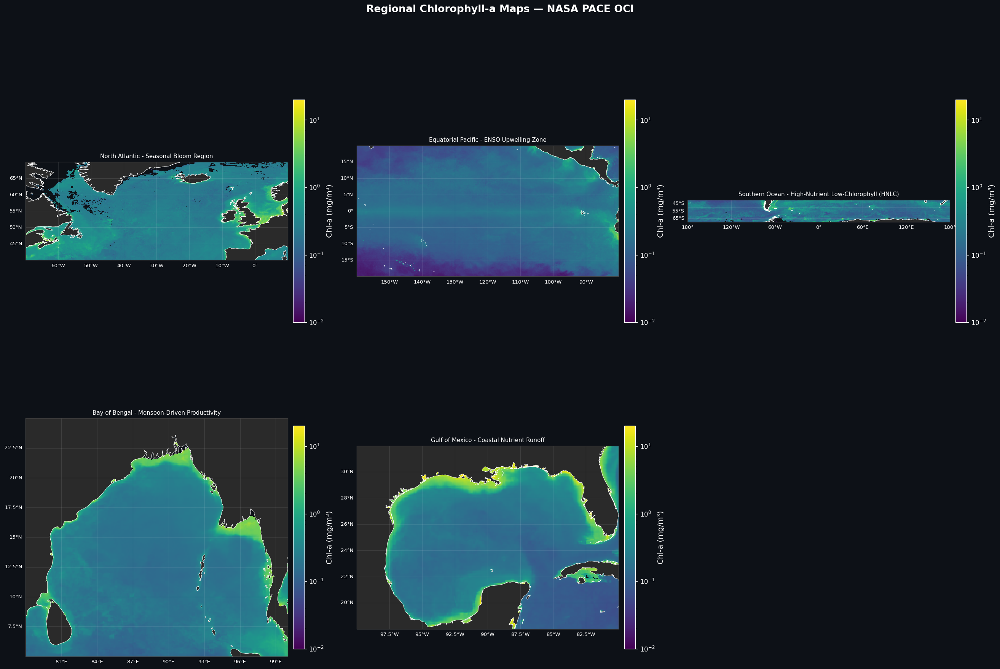

Saved -> figure2_regional_maps.png


In [ ]:
# Extent: [lon_min, lon_max, lat_min, lat_max]
REGIONS = {
    "North Atlantic Spring Bloom": {
        "extent": [-70, 10, 40, 70],       # Western Atlantic to Europe, mid-to-high latitudes
        "title":  "North Atlantic - Seasonal Bloom Region",
    },
    "Equatorial Pacific": {
        "extent": [-160, -80, -20, 20],    # Central/Eastern Pacific straddling the equator
        "title":  "Equatorial Pacific - ENSO Upwelling Zone",
    },
    "Southern Ocean": {
        "extent": [-180, 180, -70, -40],   # Full longitude band around Antarctica
        "title":  "Southern Ocean - High-Nutrient Low-Chlorophyll (HNLC)",
    },
    "Bay of Bengal": {
        "extent": [78, 100, 5, 25],        # Northeast Indian Ocean, south of India
        "title":  "Bay of Bengal - Monsoon-Driven Productivity",
    },
    "Gulf of Mexico": {
        "extent": [-100, -80, 18, 32],     # Gulf Coast of the US and Mexico
        "title":  "Gulf of Mexico - Coastal Nutrient Runoff",
    },
}

# Create a large figure to hold all 5 regional subplots
fig = plt.figure(figsize=(22, 16))
fig.patch.set_facecolor("#0d1117")  # dark background for the whole figure
fig.suptitle("Regional Chlorophyll-a Maps - NASA PACE OCI",
             fontsize=16, color="white", fontweight="bold", y=0.98)

# Loop through each region
for i, (name, info) in enumerate(REGIONS.items(), 1):

    # Unpack the extent into individual coordinate variables
    lon_min, lon_max, lat_min, lat_max = info["extent"]

    # Slice the global chlorophyll DataArray down to just this region's lat/lon box
    lats_arr = chl[lat_dim].values
    if lats_arr[0] > lats_arr[-1]:
        lat_slice = slice(lat_max, lat_min)  # descending (90 -> -90)
    else:
        lat_slice = slice(lat_min, lat_max)  # ascending (-90 -> 90)

    if lon_min == -180 and lon_max == 180:
        chl_sub_r = chl.sel({lat_dim: lat_slice})
    else:
        chl_sub_r = chl.sel({lat_dim: lat_slice, lon_dim: slice(lon_min, lon_max)})

    if chl_sub_r.size == 0:
        print(f"Warning: empty subset for {name}, skipping")
        continue

    # Extract the coordinate arrays for this region's subset
    lons_r = chl_sub_r[lon_dim].values
    lats_r = chl_sub_r[lat_dim].values

    # PlateCarree = simple rectangular lat/lon projection
    ax = fig.add_subplot(2, 3, i, projection=ccrs.PlateCarree())

    # Zoom the map to this region's bounding box
    ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())

    ax.set_facecolor("#0d1117")  # dark background where there is no data

    # Draw land and coastlines on top of the data
    ax.add_feature(cfeature.LAND,      facecolor="#2a2a2a", zorder=1)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.6, edgecolor="white", zorder=2)
    gl = ax.gridlines(
      draw_labels=True,
      linewidth=0.3,
      color="white",
      alpha=0.2,
      x_inline=False,
      y_inline=False
    )

    # cleaner label placement
    gl.top_labels = False
    gl.right_labels = False

    # white labels with subtle dark outline
    label_style = {
        "color": "white",
        "size": 8,
    }
    gl.xlabel_style = label_style
    gl.ylabel_style = label_style

    # Plot the chlorophyll data for this region as a color grid
    im = ax.pcolormesh(
        lons_r, lats_r, chl_sub_r.values,
        norm=LogNorm(vmin=0.01, vmax=20),  # log scale keeps detail at both low and high ends
        cmap="viridis",
        transform=ccrs.PlateCarree(),      # data is in standard lat/lon
        shading="auto", zorder=0           # drawn underneath coastlines
    )

    # Add a vertical colorbar to the right of subplot
    cbar = plt.colorbar(
      im,
      ax=ax,
      orientation="vertical",
      pad=0.02,
      fraction=0.04,
      label="Chl-a (mg/m³)"
  )

    # make colorbar text white
    cbar.ax.yaxis.label.set_color("white")
    cbar.ax.tick_params(colors="white")

    # optional: white outline around colorbar
    cbar.outline.set_edgecolor("white")

    # Style each subplot
    ax.set_title(info["title"], fontsize=9, color="white", pad=6)
    for spine in ax.spines.values():
        spine.set_edgecolor("#444444")

plt.tight_layout(rect=[0, 0, 1, 0.97])

plt.savefig("figure2_regional_maps.png", bbox_inches="tight", facecolor="#0d1117")
plt.show()
print("Saved -> figure2_regional_maps.png")

# **Chlorophyll Frequency Distribution for PACE**
The distribution of Chlorophyll-a is highly right-skewed, showing the dominance of low-productivity open water. Since the vast majority of pixels have very low Chlorophyll-a values, only a small amount (coastal areas, upwelling zones, and bloom regions) have high values.

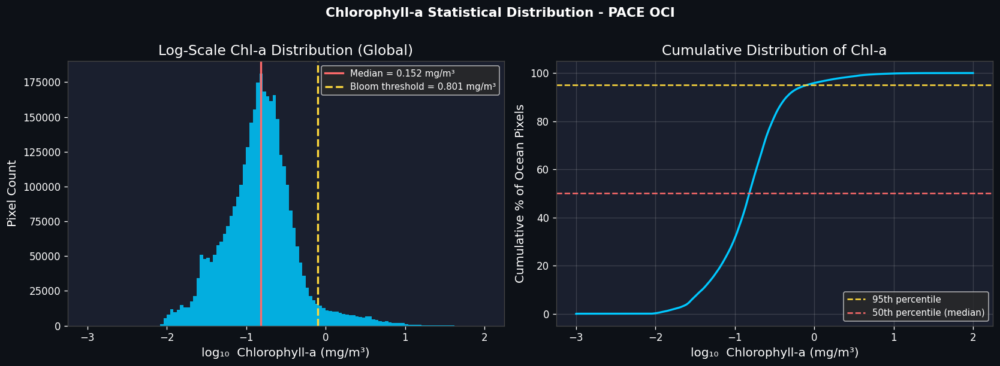

Saved -> figure3_distribution.png


In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.patch.set_facecolor("#0d1117")

for ax in axes:
    ax.set_facecolor("#1a1f2e")
    ax.tick_params(colors="white")
    ax.xaxis.label.set_color("white")
    ax.yaxis.label.set_color("white")
    ax.title.set_color("white")
    for spine in ax.spines.values():
        spine.set_edgecolor("#444444")

# Left: log-scale histogram
axes[0].hist(np.log10(chl_vals), bins=120, color="#00c8ff", edgecolor="none", alpha=0.85)
axes[0].axvline(np.log10(np.median(chl_vals)), color="#ff6b6b", lw=2,
                label=f"Median = {np.median(chl_vals):.3f} mg/m³")
axes[0].axvline(np.log10(BLOOM_THRESH), color="#ffd93d", lw=2, ls="--",
                label=f"Bloom threshold = {BLOOM_THRESH:.3f} mg/m³")
axes[0].set_xlabel("log₁₀  Chlorophyll-a (mg/m³)")
axes[0].set_ylabel("Pixel Count")
axes[0].set_title("Log-Scale Chl-a Distribution (Global)")
axes[0].legend(facecolor="#2a2a2a", labelcolor="white", fontsize=9)

# Right: cumulative distribution function
sorted_chl = np.sort(chl_vals)
cdf = np.arange(1, len(sorted_chl) + 1) / len(sorted_chl)
axes[1].plot(np.log10(sorted_chl), cdf * 100, color="#00c8ff", lw=2)
axes[1].axhline(95, color="#ffd93d", lw=1.5, ls="--", label="95th percentile")
axes[1].axhline(50, color="#ff6b6b", lw=1.5, ls="--", label="50th percentile (median)")
axes[1].set_xlabel("log₁₀  Chlorophyll-a (mg/m³)")
axes[1].set_ylabel("Cumulative % of Ocean Pixels")
axes[1].set_title("Cumulative Distribution of Chl-a")
axes[1].legend(facecolor="#2a2a2a", labelcolor="white", fontsize=9)
axes[1].grid(alpha=0.15, color="white")

plt.suptitle("Chlorophyll-a Statistical Distribution - PACE OCI",
             fontsize=13, color="white", fontweight="bold", y=1.01)
plt.tight_layout()
plt.savefig("figure3_distribution.png", bbox_inches="tight", facecolor="#0d1117")
plt.show()
print("Saved -> figure3_distribution.png")


---
#**Multi-Sensor Comparison**
**Sensor comparison** - PACE OCI vs MODIS-Aqua vs Sentinel-3 OLCI, at regional scale

| Sensor | Mission | Resolution | Chl-a Product |
|--------|---------|------------|---------------|
| OCI | PACE (2024–) | 1 km | `PACE_OCI_L3M_CHL` |
| MODIS | Aqua (2002–) | 4 km | `MODIS_AQUA_L3M_CHL` |
| OLCI | Sentinel-3A/B (2016–) | 300 m | `S3A_OLCI_L3M_CHL` / `S3B_OLCI_L3M_CHL` |

| Region                 | Why it’s Interesting                                                                                                   | Bloom Driver                                                                  |
| ---------------------- | ---------------------------------------------------------------------------------------------------------------------- | ----------------------------------------------------------------------------- |
| **North Atlantic**     | Pronounced seasonal phytoplankton blooms on Earth, widely used for satellite algorithm validation      | Increasing spring sunlight and stabilization of the upper ocean mixed layer   |
| **Gulf of Mexico**     | Strong gradients between open-ocean and nutrient-rich coastal waters make it useful for studying water quality impacts | Nutrient loading from the Mississippi and Atchafalaya Rivers                  |
| **Bay of Bengal**      | Suspended sediments and colored dissolved organic matter create challenging conditions for ocean-color retrievals | Freshwater influx and nutrient transport during the summer monsoon            |
| **Southern Ocean**     | Extremely low chlorophyll concentrations and persistent cloud cover test the sensitivity of ocean-color sensors        | Deep-water nutrient supply from circumpolar upwelling and mixing              |
| **Equatorial Pacific** | Key region for observing ENSO-related biological variability and large-scale equatorial productivity                   | Equatorial divergence and trade-wind-driven upwelling of nutrient-rich waters |


In [ ]:
# REGION CONFIGURATION - edit here to add / remove / adjust study areas
# Each entry: lon_min, lon_max, lat_min, lat_max  (decimal degrees)

STUDY_REGIONS = {
    "North Atlantic": {
        "extent":  (-60, 0, 40, 65),
        "label":   "North Atlantic Spring Bloom",
        "notes":   "Seasonal stratification bloom.",
    },
    "Gulf of Mexico": {
        "extent":  (-98, -80, 18, 32),
        "label":   "Gulf of Mexico - Coastal Eutrophication",
        "notes":   "Mississippi River nutrient discharge drives spring–summer hypoxic dead zone.",
    },
    "Bay of Bengal": {
        "extent":  (78, 100, 5, 25),
        "label":   "Bay of Bengal - Monsoon-Driven",
        "notes":   "High turbidity & CDOM from Ganges/Brahmaputra plumes.",
    },
    "Southern Ocean": {
        "extent":  (-60, 60, -65, -45),
        "label":   "Southern Ocean - Iron-Limited HNLC",
        "notes":   "Low baseline Chl-a.",
    },
    "Equatorial Pacific": {
        "extent": [-160, -80, -20, 20],
        "label":  "Equatorial Pacific - ENSO Upwelling Zone",
        "notes":   "ENSO controls productivity",

    },
}

# must match NASA Earthdata collection IDs
SENSOR_CONFIGS = {
    "PACE OCI": {
        "short_name": "PACE_OCI_L3M_CHL",
        "var": "chlor_a"
    },

    "MODIS-Aqua": {
        "short_name": "MODISA_L3M_CHL",
        "var": "chlor_a"
    },

    "Sentinel-3 OLCI": {
        "short_name": "OLCIS3A_L3m_ERR_CHL",
        "var": "chlor_a"
    },
}

# Target month for the cross-sensor snapshot comparison
SNAPSHOT_MONTH = ("2025-03-01", "2025-03-31")

# Time range for the temporal dynamics time series
TEMPORAL_RANGE  = ("2024-04-01", "2025-03-31")

print("Study regions configured:")
for name, cfg in STUDY_REGIONS.items():
    lon_min, lon_max, lat_min, lat_max = cfg["extent"]
    print(f"  {name:<20}  lon [{lon_min:>5}, {lon_max:>4}]  lat [{lat_min:>4}, {lat_max:>3}]")

print(f"\nSensors: {list(SENSOR_CONFIGS.keys())}")
print(f"Snapshot month : {SNAPSHOT_MONTH}")
print(f"Time series    : {TEMPORAL_RANGE}")


Study regions configured:
  North Atlantic        lon [  -60,    0]  lat [  40,  65]
  Gulf of Mexico        lon [  -98,  -80]  lat [  18,  32]
  Bay of Bengal         lon [   78,  100]  lat [   5,  25]
  Southern Ocean        lon [  -60,   60]  lat [ -65, -45]
  Equatorial Pacific    lon [ -160,  -80]  lat [ -20,  20]

Sensors: ['PACE OCI', 'MODIS-Aqua', 'Sentinel-3 OLCI']
Snapshot month : ('2025-03-01', '2025-03-31')
Time series    : ('2024-04-01', '2025-03-31')


##**Cross-Sensor Comparison (PACE OCI vs MODIS-Aqua vs Sentinel-3 OLCI)**


In [ ]:
# Download snapshot granules for all sensors
import earthaccess, xarray as xr, numpy as np
import matplotlib.pyplot as plt, cartopy.crs as ccrs, cartopy.feature as cfeature
from matplotlib.colors import LogNorm
import scipy.interpolate as spi
from scipy.stats import linregress
import pandas as pd, warnings, os
warnings.filterwarnings("ignore")

earthaccess.login(persist=True)

# snapshot_files[sensor_label] = (local_path, variable_name)
snapshot_files = {}

for label, cfg in SENSOR_CONFIGS.items():
    results = earthaccess.search_data(
        short_name=cfg["short_name"],
        temporal=SNAPSHOT_MONTH,
        count=1
    )
    if results:
        dl = earthaccess.download(results, f"./pace_data/snapshot/{label.replace(' ','_')}")
        snapshot_files[label] = (dl[0], cfg["var"])
        print(f"(Valid) {label:22s} -> {os.path.basename(dl[0])}")
    else:
        print(f"(Invalid) {label:22s} - no granule found (check Earthdata access permissions)")

print(f"\n{len(snapshot_files)}/{len(SENSOR_CONFIGS)} sensors downloaded.")


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

(Valid) PACE OCI               -> PACE_OCI.20241221_20250320.L3m.SNWI.CHL.V3_1.chlor_a.0p1deg.nc


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

(Valid) MODIS-Aqua             -> AQUA_MODIS.20020704_20250331.L3m.CU.CHL.chlor_a.4km.nc


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

(Valid) Sentinel-3 OLCI        -> S3A_OLCI_ERRNT.20160401_20250430.L3m.MC.CHL.chlor_a.9km.nc

3/3 sensors downloaded.


In [ ]:
# Load a NetCDF dataset from a specified file, extract a particular variable
# (like chlorophyll-a), and then clip the data to a defined geographical bounding box.
def load_region(filepath, var_name, extent):
    """
    Open a NetCDF file, extract the Chl-a variable, and clip to extent.
    extent = (lon_min, lon_max, lat_min, lat_max)
    Returns (DataArray, lat_dim_name, lon_dim_name)
    """
    lon_min, lon_max, lat_min, lat_max = extent
    ds  = xr.open_dataset(filepath)
    chl = ds[var_name].squeeze()

    lat_dim = [d for d in chl.dims if "lat" in d.lower()][0]
    lon_dim = [d for d in chl.dims if "lon" in d.lower()][0]

    lats = chl[lat_dim].values
    lat_sl = (slice(lat_max, lat_min) if lats[0] > lats[-1]
              else slice(lat_min, lat_max))

    chl_sub = chl.sel({lat_dim: lat_sl,
                        lon_dim: slice(lon_min, lon_max)})
    #clipped xarray.DataArray containing the specified variable for the given
    # region, along with the names of the latitude and longitude dimensions.
    return chl_sub, lat_dim, lon_dim

# Regrid source DataArray onto the target DataArray's latitude and longitude grid
# to compare data from different sensors that could have varying spatial resolutions.
def regrid_to_target(source_da, target_da):
    src_ld = [d for d in source_da.dims if "lat" in d.lower()][0]
    src_od = [d for d in source_da.dims if "lon" in d.lower()][0]
    tgt_ld = [d for d in target_da.dims if "lat" in d.lower()][0]
    tgt_od = [d for d in target_da.dims if "lon" in d.lower()][0]

    SLon, SLat = np.meshgrid(source_da[src_od].values, source_da[src_ld].values)
    TLon, TLat = np.meshgrid(target_da[tgt_od].values, target_da[tgt_ld].values)

    src_v = source_da.values.flatten()
    valid = ~np.isnan(src_v) & (src_v > 0)
    if valid.sum() < 10:
        return np.full(TLon.shape, np.nan)

    interp = spi.LinearNDInterpolator(
        list(zip(SLon.flatten()[valid], SLat.flatten()[valid])),
        src_v[valid]
    )
    # array representing the source_da data resampled to the target_da's grid.
    return interp(TLon, TLat)

print("Helper functions defined.")


Helper functions defined.


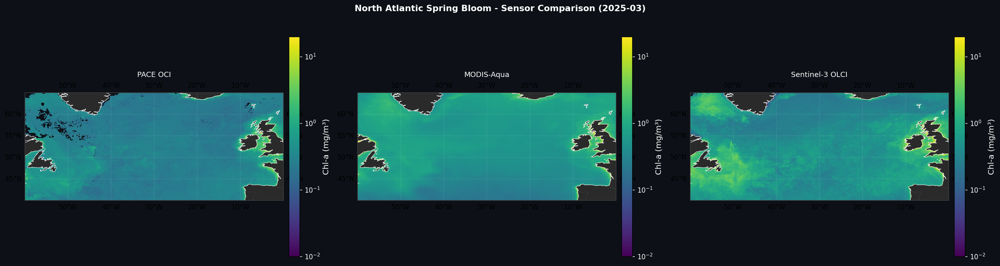

Saved -> figA_maps_north_atlantic.png


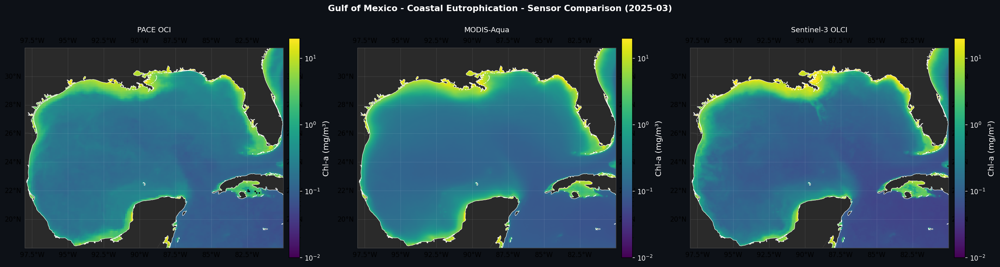

Saved -> figA_maps_gulf_of_mexico.png


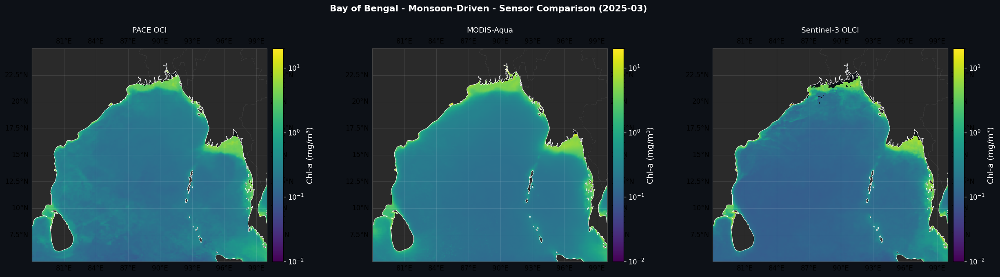

Saved -> figA_maps_bay_of_bengal.png


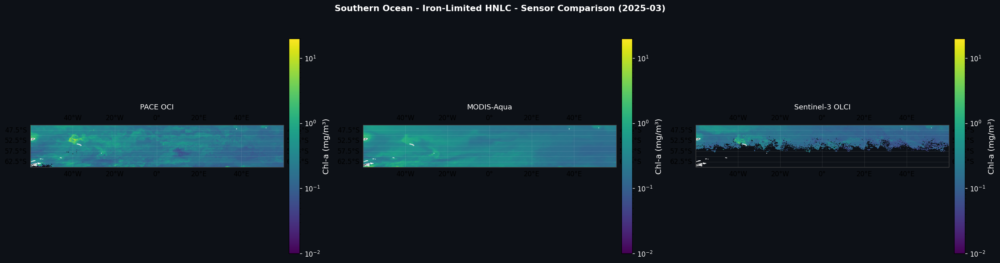

Saved -> figA_maps_southern_ocean.png


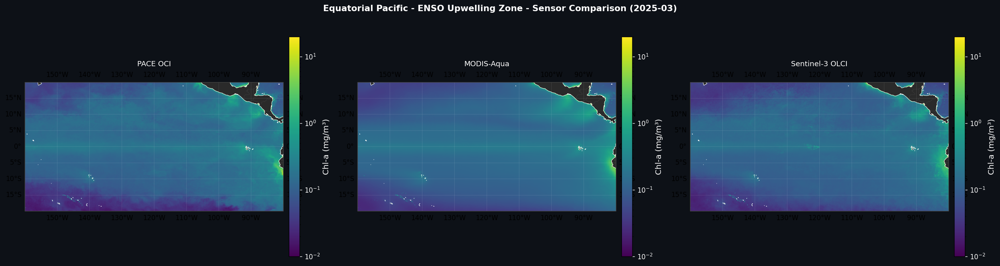

Saved -> figA_maps_equatorial_pacific.png


In [ ]:
# Side-by-side sensor maps (one figure per region)

# Initialize a logarithmic color normalization for consistent scaling across plots
norm = LogNorm(vmin=0.01, vmax=20)

# Iterate through each defined study region
for region_name, rcfg in STUDY_REGIONS.items():
    # Extract the geographical extent (bounding box) for the current region
    extent = rcfg["extent"]
    lon_min, lon_max, lat_min, lat_max = extent

    # Load data for all available sensors for this specific region
    region_data = {}   # Dictionary to store DataArray for each sensor (sensor_label -> DataArray)
    for label, (fpath, var) in snapshot_files.items():
        try:
            # Load and clip the sensor's data to the region's extent using the helper function
            chl_sub, ld, od = load_region(fpath, var, extent)
            region_data[label] = chl_sub
        except Exception as e:
            print(f"  [{region_name}] {label}: {e}")

    # Skip the region if no data was successfully loaded for any sensor
    if not region_data:
        print(f"No data for {region_name}, skipping.")
        continue

    # Determine the number of sensors with data for this region
    n_sensors = len(region_data)

    # Create a figure and a set of subplots (one for each sensor) with PlateCarree projection
    fig, axes = plt.subplots(1, n_sensors, figsize=(7 * n_sensors, 5.5),
                              subplot_kw={"projection": ccrs.PlateCarree()})
    fig.patch.set_facecolor("#0d1117")
    if n_sensors == 1:
        axes = [axes]

    # Iterate through each subplot and its corresponding sensor data
    for ax, (label, chl_sub) in zip(axes, region_data.items()):
        lat_dim = [d for d in chl_sub.dims if "lat" in d.lower()][0]
        lon_dim = [d for d in chl_sub.dims if "lon" in d.lower()][0]

        # Build 2D meshgrid - fixes empty sensor comparison maps
        lons_2d, lats_2d = np.meshgrid(chl_sub[lon_dim].values, chl_sub[lat_dim].values)

        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
        ax.set_facecolor("#0d1117")
        ax.add_feature(cfeature.LAND,      facecolor="#2a2a2a", zorder=1)
        ax.add_feature(cfeature.COASTLINE, linewidth=0.6, edgecolor="white", zorder=2)
        ax.add_feature(cfeature.BORDERS,   linewidth=0.2, edgecolor="#555", zorder=2)
        ax.gridlines(draw_labels=True, linewidth=0.3, color="white", alpha=0.2,
                    x_inline=False, y_inline=False)

        im = ax.pcolormesh(lons_2d, lats_2d,
                          chl_sub.values, norm=norm, cmap="viridis",
                          transform=ccrs.PlateCarree(), shading="auto", zorder=0)
        cb = plt.colorbar(im, ax=ax, orientation="vertical", pad=0.02, fraction=0.04)
        cb.set_label("Chl-a (mg/m³)", color="white")
        cb.ax.yaxis.set_tick_params(color="white")
        plt.setp(cb.ax.yaxis.get_ticklabels(), color="white")
        ax.set_title(label, fontsize=11, color="white", pad=8)
        for spine in ax.spines.values(): spine.set_edgecolor("#444")

    # Set a main title for the entire figure
    fig.suptitle(f"{rcfg['label']} - Sensor Comparison ({SNAPSHOT_MONTH[0][:7]})",
                 fontsize=13, color="white", fontweight="bold", y=1.01)
    plt.tight_layout()
    safe_name = region_name.lower().replace(" ", "_")
    plt.savefig(f"figA_maps_{safe_name}.png", bbox_inches="tight", facecolor="#0d1117")

    # Display the figure
    plt.show()
    print(f"Saved -> figA_maps_{safe_name}.png")

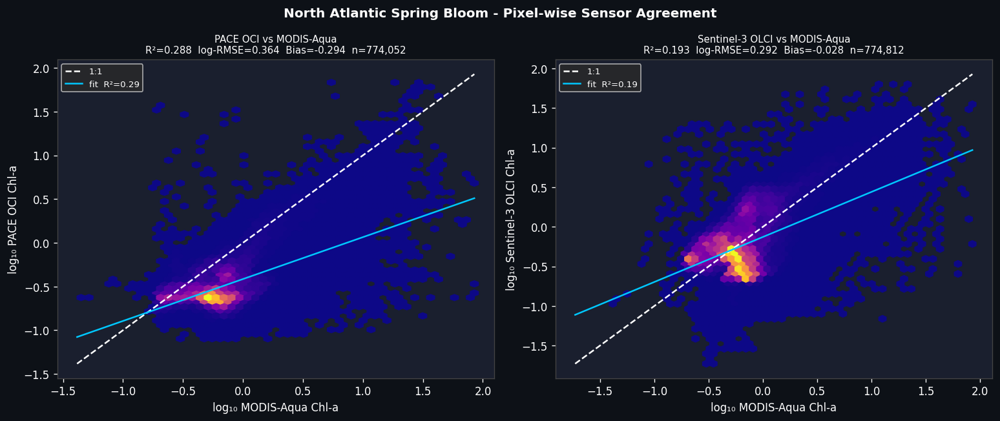

Saved -> figA_scatter_north_atlantic.png


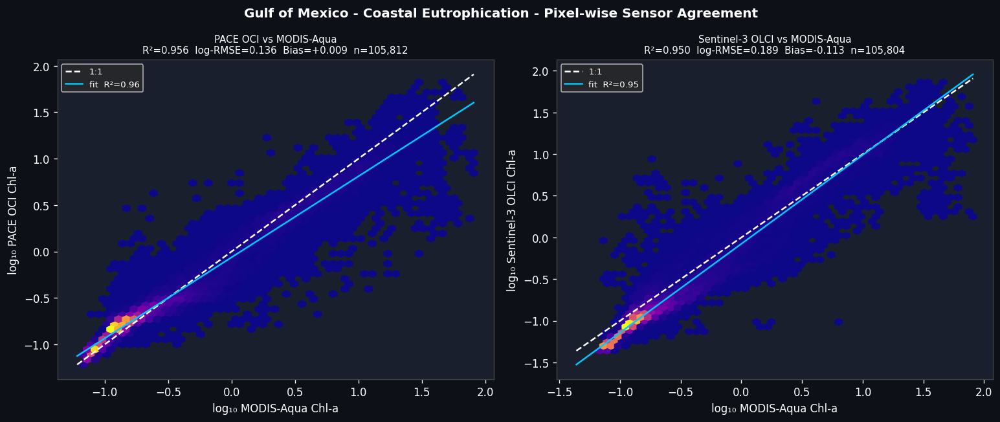

Saved -> figA_scatter_gulf_of_mexico.png


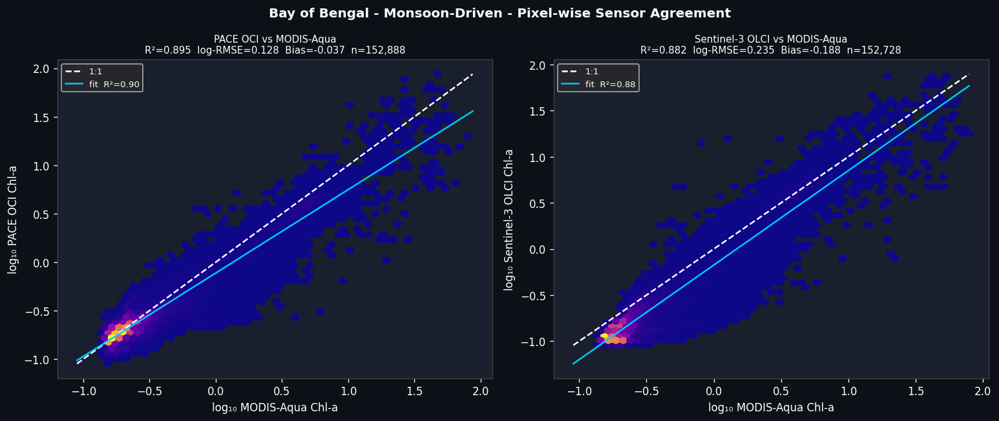

Saved -> figA_scatter_bay_of_bengal.png


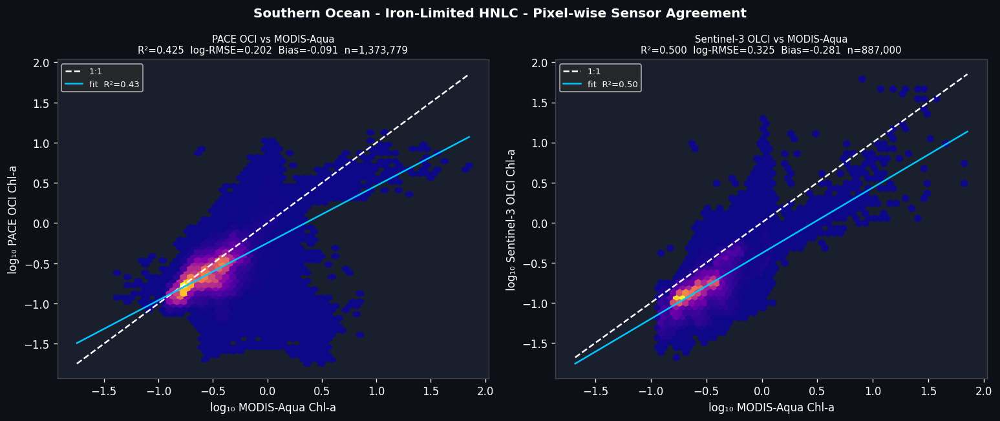

Saved -> figA_scatter_southern_ocean.png


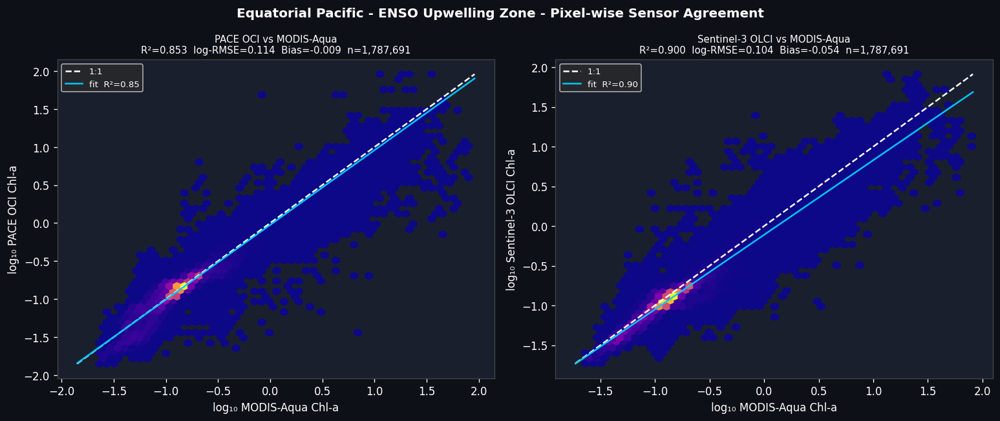

Saved -> figA_scatter_equatorial_pacific.png


In [ ]:
# Pixel-wise scatter and bias statistics
# Reference sensor is MODIS-Aqua (longest record) and ther sensors are regridded onto it before comparison.

REF_SENSOR = "MODIS-Aqua" # Define the reference sensor for comparison

all_stats_rows = []   # List to collect statistical results for each comparison

# Loop through each defined study region
for region_name, rcfg in STUDY_REGIONS.items():
    extent = rcfg["extent"] # Get the geographical extent of the current region

    # Load all sensors for this region
    region_data = {} # Dictionary to store DataArray for each sensor (sensor_label -> DataArray)
    for label, (fpath, var) in snapshot_files.items():
        try:
            # Load and clip the sensor's data to the region's extent using the helper function
            chl_sub, *_ = load_region(fpath, var, extent)
            region_data[label] = chl_sub
        except Exception:
            pass

    # Skip the scatter plot and statistics if the reference sensor is missing or fewer than 2 sensors have data
    if REF_SENSOR not in region_data or len(region_data) < 2:
        print(f"[{region_name}] Skipping scatter: need ≥2 sensors incl. {REF_SENSOR}.")
        continue

    ref_da   = region_data[REF_SENSOR] # Get DataArray for the reference sensor
    ref_vals = ref_da.values # Get numerical values from the reference DataArray

    # Regrid other sensors to the reference grid using helper function
    resampled = {REF_SENSOR: ref_vals} # Initialize with reference sensor data
    for label, da in region_data.items():
        if label == REF_SENSOR: continue # Skip the reference sensor itself
        resampled[label] = regrid_to_target(da, ref_da) # Regrid other sensor data to the reference grid

    # Scatter plots
    # Create pairs for comparison, always against the reference sensor
    compare_pairs = [(k, REF_SENSOR) for k in resampled if k != REF_SENSOR]

    # Create a figure and subplots for each comparison pair
    fig, axes = plt.subplots(1, len(compare_pairs),
                              figsize=(6.5 * len(compare_pairs), 5.5))
    fig.patch.set_facecolor("#0d1117")
    if len(compare_pairs) == 1: axes = [axes]
    # Iterate through each subplot and its corresponding comparison pair
    for ax, (sensor_a, sensor_b) in zip(axes, compare_pairs):
        ax.set_facecolor("#1a1f2e")
        ax.tick_params(colors="white")
        for spine in ax.spines.values(): spine.set_edgecolor("#444")

        va = resampled[sensor_a].flatten()
        vb = resampled[sensor_b].flatten()
        # Create a mask for valid (non-NaN, positive) and overlapping pixels
        mask = (~np.isnan(va)) & (~np.isnan(vb)) & (va > 0) & (vb > 0)
        xa, xb = va[mask], vb[mask] # Filter data using the mask

        # If insufficient valid pixels for comparison, display a message and continue
        if mask.sum() < 20:
            ax.text(0.5, 0.5, "Insufficient overlap", transform=ax.transAxes,
                    ha="center", color="white")
            continue

        # Create a hexbin plot (density plot) of log-transformed Chl-a values
        ax.hexbin(np.log10(xb), np.log10(xa), gridsize=50, cmap="plasma", mincnt=1)

        # Determine plot limits based on the data range
        lims = [min(np.log10(xb).min(), np.log10(xa).min()),
                max(np.log10(xb).max(), np.log10(xa).max())]
        ax.plot(lims, lims, "w--", lw=1.5, label="1:1") # Plot the 1:1 line

        # Perform linear regression on log-transformed data
        slope, intercept, r, *_ = linregress(np.log10(xb), np.log10(xa))
        # Plot the regression line
        ax.plot(lims, [slope * l + intercept for l in lims],
                color="#00c8ff", lw=1.5, label=f"fit  R²={r**2:.2f}")

        # Calculate Root Mean Square Error (RMSE) and Bias on log-transformed data
        rmse = np.sqrt(np.mean((np.log10(xa) - np.log10(xb))**2))
        bias = np.mean(np.log10(xa) - np.log10(xb))

        # Set x and y axis labels
        ax.set_xlabel(f"log₁₀ {sensor_b} Chl-a", color="white", fontsize=10)
        ax.set_ylabel(f"log₁₀ {sensor_a} Chl-a", color="white", fontsize=10)
        ax.set_title(f"{sensor_a} vs {sensor_b}\n"
                     f"R²={r**2:.3f}  log-RMSE={rmse:.3f}  Bias={bias:+.3f}  n={mask.sum():,}",
                     color="white", fontsize=9)
        ax.legend(facecolor="#2a2a2a", labelcolor="white", fontsize=8)
        ax.xaxis.label.set_color("white"); ax.yaxis.label.set_color("white")

        # Collect for summary table
        all_stats_rows.append({
            "Region":     region_name,
            "Sensor A":   sensor_a,
            "Sensor B":   sensor_b,
            "n pixels":   int(mask.sum()), # n: the count of valid, overlapping pixels used in the comparison.
            "R²":         round(r**2, 3), # R²: how well the variations in one sensor's data are explained by the variations in the reference sensor's data.
            "log-RMSE":   round(rmse, 3), # log-RMSE: average magnitude of the differences between the predicted (other sensor) and actual (reference sensor) values on a log scale.
            "log-Bias":   round(bias, 3), # log-Bias: average difference between the two sensors' log-transformed chlorophyll values.
        })

    fig.suptitle(f"{rcfg['label']} - Pixel-wise Sensor Agreement",
                 fontsize=12, color="white", fontweight="bold")
    plt.tight_layout()

    safe_name = region_name.lower().replace(" ", "_") # Create a safe filename from the region name
    plt.savefig(f"figA_scatter_{safe_name}.png", bbox_inches="tight", facecolor="#0d1117")

    plt.show() # Display the figure
    print(f"Saved -> figA_scatter_{safe_name}.png")

In [ ]:
#  A-5  Summary statistics
import pandas as pd
from IPython.display import display, HTML

TABLE_CSS = """
<style>
  .pace-table {
    border-collapse: collapse;
    font-family: 'Segoe UI', Arial, sans-serif;
    font-size: 13px;
    width: 100%;
    margin-bottom: 28px;
  }
  .pace-table caption {
    font-size: 14px;
    font-weight: 700;
    color: #e2e8f0;
    background: #1e293b;
    padding: 10px 14px;
    text-align: left;
    border: 1px solid #334155;
    border-bottom: none;
    letter-spacing: 0.3px;
  }
  .pace-table thead th {
    background: #0f172a;
    color: #94a3b8;
    font-weight: 600;
    padding: 8px 14px;
    border: 1px solid #334155;
    text-align: center;
    white-space: nowrap;
  }
  .pace-table tbody tr:nth-child(odd)  { background: #1a2332; }
  .pace-table tbody tr:nth-child(even) { background: #151f2e; }
  .pace-table tbody tr:hover           { background: #1e3a5f; }
  .pace-table tbody td {
    padding: 7px 14px;
    border: 1px solid #2d3748;
    color: #cbd5e1;
    text-align: center;
    white-space: nowrap;
  }
  .pace-table tbody td:first-child,
  .pace-table tbody td:nth-child(2) {
    text-align: left;
    font-weight: 500;
    color: #e2e8f0;
  }
  /* group separator: bold top border whenever the first-column value changes */
  .pace-table tr.group-start td {
    border-top: 2px solid #475569;
  }
  /* colour-code R² cells */
  .r2-high  { color: #4ade80 !important; font-weight: 600; }
  .r2-mid   { color: #fbbf24 !important; }
  .r2-low   { color: #f87171 !important; }
  /* colour-code bias cells */
  .bias-pos { color: #f87171 !important; }
  .bias-neg { color: #60a5fa !important; }
  .bias-neu { color: #94a3b8 !important; }
</style>
"""
display(HTML(TABLE_CSS))

# TABLE 1 - Cross-region inter-sensor agreement
if all_stats_rows:
    rows_html = []
    prev_region = None
    for row in all_stats_rows:
        region  = row["Region"]
        r2      = row["R²"]
        bias    = row["log-Bias"]
        rmse    = row["log-RMSE"]
        n       = row["n pixels"]

        group_cls = "group-start" if region != prev_region else ""
        prev_region = region

        r2_cls   = "r2-high" if r2 >= 0.8 else ("r2-mid" if r2 >= 0.5 else "r2-low")
        bias_cls = "bias-pos" if bias > 0.05 else ("bias-neg" if bias < -0.05 else "bias-neu")

        rows_html.append(f"""
        <tr class="{group_cls}">
          <td>{region}</td>
          <td>{row["Sensor A"]}</td>
          <td>{row["Sensor B"]}</td>
          <td>{n:,}</td>
          <td class="{r2_cls}">{r2:.3f}</td>
          <td>{rmse:.3f}</td>
          <td class="{bias_cls}">{bias:+.3f}</td>
        </tr>""")

    table1 = f"""
    <table class="pace-table">
      <caption>&#9654; Cross-Region Inter-Sensor Agreement &nbsp;|&nbsp; All sensors regridded to MODIS 4-km grid &nbsp;|&nbsp; Snapshot month: {SNAPSHOT_MONTH[0][:7]}</caption>
      <thead>
        <tr>
          <th>Region</th><th>Sensor A</th><th>vs. Sensor B</th>
          <th>Pixels (n)</th>
          <th>R² <span style="font-weight:400;color:#64748b">(log)</span></th>
          <th>RMSE <span style="font-weight:400;color:#64748b">(log)</span></th>
          <th>Bias <span style="font-weight:400;color:#64748b">(log, A−B)</span></th>
        </tr>
      </thead>
      <tbody>{"".join(rows_html)}</tbody>
    </table>
    <p style="font-size:11px;color:#64748b;margin-top:-20px;margin-bottom:24px;">
      ■ <span style="color:#4ade80">Green R² ≥ 0.80</span> &nbsp;
      ■ <span style="color:#fbbf24">Yellow 0.50–0.79</span> &nbsp;
      ■ <span style="color:#f87171">Red &lt; 0.50</span> &emsp;
      ■ <span style="color:#f87171">Red bias</span> = Sensor A reads higher &nbsp;
      ■ <span style="color:#60a5fa">Blue bias</span> = Sensor A reads lower &nbsp;
      ■ Grey = negligible (&lt;±0.05)
    </p>
    """
    display(HTML(table1))
else:
    display(HTML("<p style='color:#f87171'>No inter-sensor comparison rows - check sensor availability.</p>"))

# TABLE 2 - Per-sensor Chl-a statistics by region
stat_rows = []
for region_name, rcfg in STUDY_REGIONS.items():
    extent = rcfg["extent"]
    for label, (fpath, var) in snapshot_files.items():
        try:
            chl_sub, *_ = load_region(fpath, var, extent)
            v = chl_sub.values.flatten()
            v = v[(~np.isnan(v)) & (v > 0)]
            stat_rows.append({
                "Region":  region_name,
                "Sensor":  label,
                "n":       len(v),
                "mean":    v.mean(),
                "median":  float(np.median(v)),
                "p95":     float(np.percentile(v, 95)),
                "logstd":  float(np.std(np.log10(v))),
            })
        except Exception:
            pass

if stat_rows:
    rows_html2 = []
    prev_region = None
    for row in stat_rows:
        region = row["Region"]
        group_cls = "group-start" if region != prev_region else ""
        prev_region = region

        # Colour-code log-std: high = more variable = more bloom-prone
        ls = row["logstd"]
        ls_style = ("color:#f87171;font-weight:600" if ls > 0.6
                    else "color:#fbbf24" if ls > 0.35
                    else "color:#94a3b8")

        rows_html2.append(f"""
        <tr class="{group_cls}">
          <td>{region}</td>
          <td>{row["Sensor"]}</td>
          <td>{row["n"]:,}</td>
          <td>{row["mean"]:.4f}</td>
          <td>{row["median"]:.4f}</td>
          <td>{row["p95"]:.4f}</td>
          <td style="{ls_style}">{row["logstd"]:.3f}</td>
        </tr>""")

    table2 = f"""
    <table class="pace-table">
      <caption>&#9654; Per-Sensor Chl-a Statistics by Region &nbsp;|&nbsp; Snapshot month: {SNAPSHOT_MONTH[0][:7]}</caption>
      <thead>
        <tr>
          <th>Region</th><th>Sensor</th><th>Valid pixels</th>
          <th>Mean<br><span style="font-weight:400;color:#64748b">(mg m⁻³)</span></th>
          <th>Median<br><span style="font-weight:400;color:#64748b">(mg m⁻³)</span></th>
          <th>95th pct<br><span style="font-weight:400;color:#64748b">(mg m⁻³)</span></th>
          <th>Log-std<br><span style="font-weight:400;color:#64748b">(variability)</span></th>
        </tr>
      </thead>
      <tbody>{"".join(rows_html2)}</tbody>
    </table>
    <p style="font-size:11px;color:#64748b;margin-top:-20px;">
      Log-std measures spatial variability in log space. &nbsp;
      <span style="color:#f87171">&gt; 0.60 = highly variable (patchy blooms)</span> &nbsp;
      <span style="color:#fbbf24">0.35–0.60 = moderate</span> &nbsp;
      <span style="color:#94a3b8">&lt; 0.35 = relatively uniform</span>
    </p>
    """
    display(HTML(table2))


Region,Sensor A,vs. Sensor B,Pixels (n),R² (log),RMSE (log),"Bias (log, A−B)"
North Atlantic,PACE OCI,MODIS-Aqua,"774,052",0.288,0.364,-0.294
North Atlantic,Sentinel-3 OLCI,MODIS-Aqua,"774,812",0.193,0.292,-0.028
Gulf of Mexico,PACE OCI,MODIS-Aqua,"105,812",0.956,0.136,+0.009
Gulf of Mexico,Sentinel-3 OLCI,MODIS-Aqua,"105,804",0.950,0.189,-0.113
Bay of Bengal,PACE OCI,MODIS-Aqua,"152,888",0.895,0.128,-0.037
Bay of Bengal,Sentinel-3 OLCI,MODIS-Aqua,"152,728",0.882,0.235,-0.188
Southern Ocean,PACE OCI,MODIS-Aqua,"1,373,779",0.425,0.202,-0.091
Southern Ocean,Sentinel-3 OLCI,MODIS-Aqua,"887,000",0.500,0.325,-0.281
Equatorial Pacific,PACE OCI,MODIS-Aqua,"1,787,691",0.853,0.114,-0.009
Equatorial Pacific,Sentinel-3 OLCI,MODIS-Aqua,"1,787,691",0.900,0.104,-0.054


Region,Sensor,Valid pixels,Mean(mg m⁻³),Median(mg m⁻³),95th pct(mg m⁻³),Log-std(variability)
North Atlantic,PACE OCI,"132,726",0.3757,0.2594,0.7307,0.217
North Atlantic,MODIS-Aqua,"777,797",0.7198,0.5951,1.3052,0.234
North Atlantic,Sentinel-3 OLCI,"194,079",0.7754,0.4706,2.1979,0.305
Gulf of Mexico,PACE OCI,"18,574",0.9600,0.1845,4.9974,0.537
Gulf of Mexico,MODIS-Aqua,"106,407",1.2666,0.1572,6.9385,0.598
Gulf of Mexico,Sentinel-3 OLCI,"26,355",1.0808,0.1192,6.5401,0.629
Bay of Bengal,PACE OCI,"26,876",0.5205,0.2074,2.3237,0.351
Bay of Bengal,MODIS-Aqua,"154,065",0.6623,0.2116,3.0962,0.389
Bay of Bengal,Sentinel-3 OLCI,"38,110",0.4150,0.1347,1.8344,0.385
Southern Ocean,PACE OCI,"239,079",0.2747,0.2186,0.5435,0.225


# **Sensor Comparison Summary**

This analysis compares PACE OCI and Sentinel-3 OLCI chlorophyll-a data against MODIS-Aqua. MODIS-Aqua was used as the comparison baseline because of its long and widely validated ocean-color record.

**Metric Defintions:**
*   **R² (Coefficient of Determination)**: Indicates the proportion of variance in the reference sensor's data explained by the other sensor. Higher R² suggests a better ability to capture the *pattern* or *relative changes*.
*   **log-RMSE (Root Mean Square Error)**: Lower log-RMSE indicates smaller average errors.
*   **log-Bias**: A bias close to zero means the sensors are, on average, in agreement.

**PACE OCI vs. MODIS-Aqua:**
“In this snapshot comparison, PACE OCI showed higher agreement with MODIS-Aqua than Sentinel-3 OLCI across several study regions. This it captures the spatial patterns and variability of Chl-a more similarly to MODIS-Aqua. However, it can also show a higher log-RMSE because of a noticeable log-Bias, often negative, meaning PACE OCI tends to slightly underestimate Chl-a concentrations compared to MODIS-Aqua.

**Sentinel-3 OLCI vs. MODIS-Aqua:**
Sentinel-3 OLCI usually has a slightly lower R² than PACE OCI, but it often shows lower log-RMSE and a log-Bias closer to zero. This suggests its Chl-a values are in better overall agreement with MODIS-Aqua, even if it does not capture variability patterns quite as strongly.

**Overall:**
There isn't a best sensor since each has its own strengths. PACE OCI is better at detecting relative spatial patterns, while Sentinel-3 OLCI tends to provide closer absolute Chlorophyll-a values to MODIS-Aqua. These differences likely come from variations in sensor design, spectral bands, and processing algorithms.


---
##**Temporal Dynamics - Regional Bloom Time Series (PACE OCI)**


In [ ]:
# Download PACE time-series granules
import re
from datetime import datetime

# Find PACE OCI granules within the TEMPORAL_RANGE
ts_results = earthaccess.search_data(
    short_name=SENSOR_CONFIGS["PACE OCI"]["short_name"],
    temporal=TEMPORAL_RANGE,
)

# Sort chronologically (earthaccess returns newest-first by default)
ts_results = sorted(
    ts_results,
    key=lambda r: r["umm"]["TemporalExtent"]["RangeDateTime"]["BeginningDateTime"]
)
print(f"Found {len(ts_results)} PACE granule(s) for {TEMPORAL_RANGE}.")

# Download identified granules to a local directory
ts_files = earthaccess.download(ts_results, "./pace_data/timeseries")

# Helper function to parse the date from each downloaded filename
def extract_date(fp):
    m = re.search(r"(\d{8})", os.path.basename(fp))
    return datetime.strptime(m.group(1), "%Y%m%d") if m else datetime.min

# Sorts the downloaded files chronologically based on their extracted dates
ts_files  = sorted(ts_files, key=extract_date)
ts_dates  = [extract_date(f) for f in ts_files]

print(f"Downloaded {len(ts_files)} file(s):")
for d, f in zip(ts_dates, ts_files):
    print(f"  {d.strftime('%Y-%m')}  {os.path.basename(f)}")


Found 938 PACE granule(s) for ('2024-04-01', '2025-03-31').


QUEUEING TASKS | :   0%|          | 0/938 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/938 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/938 [00:00<?, ?it/s]

Downloaded 938 file(s):
  2024-03  PACE_OCI.20240305_20240405.L3m.R32.CHL.V3_1.chlor_a.0p1deg.nc
  2024-03  PACE_OCI.20240305_20240405.L3m.R32.CHL.V3_1.chlor_a.4km.nc
  2024-03  PACE_OCI.20240313_20240413.L3m.R32.CHL.V3_1.chlor_a.0p1deg.nc
  2024-03  PACE_OCI.20240313_20240413.L3m.R32.CHL.V3_1.chlor_a.4km.nc
  2024-03  PACE_OCI.20240321_20240620.L3m.SNSP.CHL.V3_1.chlor_a.0p1deg.nc
  2024-03  PACE_OCI.20240321_20240620.L3m.SNSP.CHL.V3_1.chlor_a.4km.nc
  2024-03  PACE_OCI.20240321_20240421.L3m.R32.CHL.V3_1.chlor_a.0p1deg.nc
  2024-03  PACE_OCI.20240321_20240421.L3m.R32.CHL.V3_1.chlor_a.4km.nc
  2024-03  PACE_OCI.20240329_20240405.L3m.8D.CHL.V3_1.chlor_a.0p1deg.nc
  2024-03  PACE_OCI.20240329_20240405.L3m.8D.CHL.V3_1.chlor_a.4km.nc
  2024-03  PACE_OCI.20240329_20240429.L3m.R32.CHL.V3_1.chlor_a.4km.nc
  2024-03  PACE_OCI.20240329_20240429.L3m.R32.CHL.V3_1.chlor_a.0p1deg.nc
  2024-04  PACE_OCI.20240401.L3m.DAY.CHL.V3_1.chlor_a.0p1deg.nc
  2024-04  PACE_OCI.20240401.L3m.DAY.CHL.V3_1.chlor_a.

*The analysis focuses on the **top 5%** of chlorophyll-a values becuase it allows us to identify of areas that are significantly more productive than the vast majority of the ocean. As previously mentioned, the distribution of chlorophyll-a is highly right-skewed, which means that most ocean areas have very low chlorophyll-a.*

In [ ]:
# Extract regional mean and 95th-pct Chlorophyll-a for every month

# Get variable name for PACE OCI from the SENSOR_CONFIGS dictionary
PACE_VAR = SENSOR_CONFIGS["PACE OCI"]["var"]

# Make dict to store time-series statistics for each study region
# Each region will have lists for means and p95s (95th percentile)
ts_stats = {name: {"means": [], "p95s": [], "n_valid": []} for name in STUDY_REGIONS}

for fp in ts_files:
    for region_name, rcfg in STUDY_REGIONS.items():
        try:
            chl_sub, *_ = load_region(fp, PACE_VAR, rcfg["extent"])
            v = chl_sub.values.flatten()
            v = v[(~np.isnan(v)) & (v > 0)]
            total_pixels = chl_sub.size

            ts_stats[region_name]["means"].append(float(np.mean(v)) if len(v) else np.nan)
            ts_stats[region_name]["p95s"].append(float(np.percentile(v, 95)) if len(v) else np.nan)
            ts_stats[region_name]["n_valid"].append(len(v))          # track coverage
        except Exception as e:
            ts_stats[region_name]["means"].append(np.nan)
            ts_stats[region_name]["p95s"].append(np.nan)
            ts_stats[region_name]["n_valid"].append(0)

print("Regional statistics extracted.")

# Print summary for each region
for region_name in STUDY_REGIONS:
    # Count months with valid mean chlorophyll-a data for the region
    valid = sum(1 for m in ts_stats[region_name]["means"] if not np.isnan(m))
    print(f"  {region_name:<22}  {valid}/{len(ts_files)} valid months")

Regional statistics extracted.
  North Atlantic          918/938 valid months
  Gulf of Mexico          912/938 valid months
  Bay of Bengal           914/938 valid months
  Southern Ocean          918/938 valid months
  Equatorial Pacific      924/938 valid months


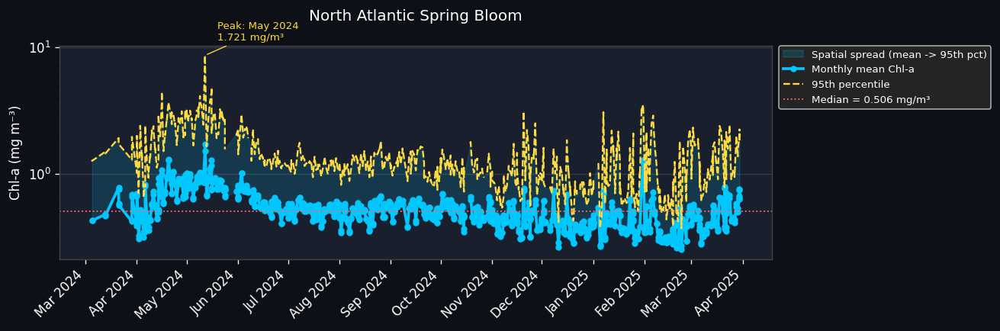

Saved -> figB_timeseries_north_atlantic.png


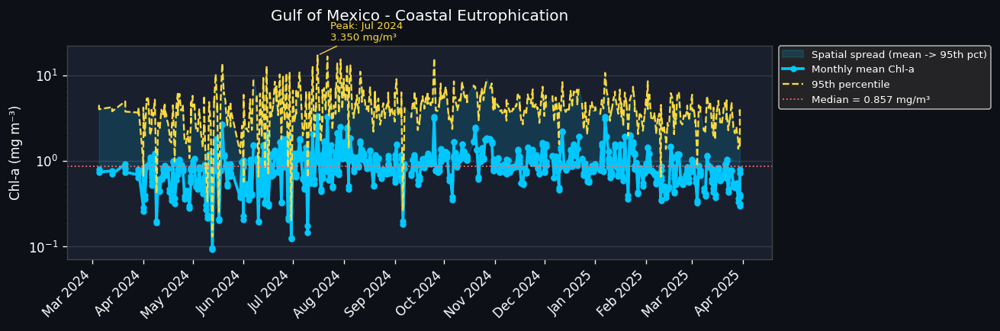

Saved -> figB_timeseries_gulf_of_mexico.png


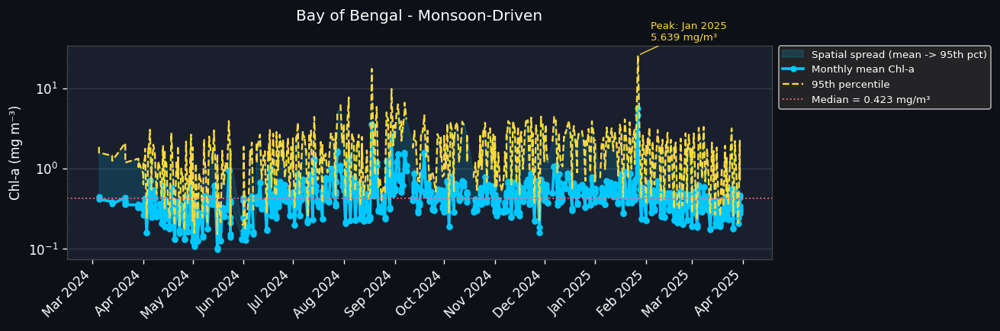

Saved -> figB_timeseries_bay_of_bengal.png


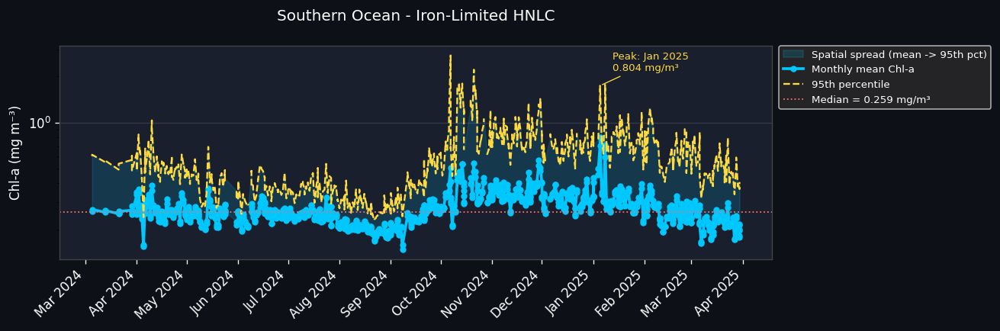

Saved -> figB_timeseries_southern_ocean.png


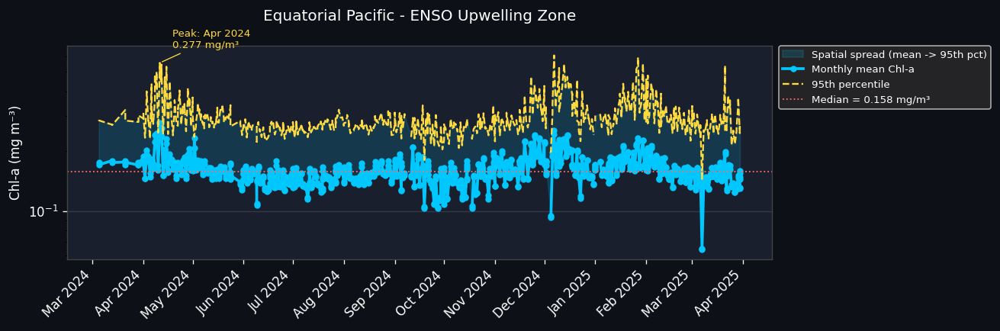

Saved -> figB_timeseries_equatorial_pacific.png


In [ ]:
# Time-series plots (one figure per region to avoid clutter)
import matplotlib.dates as mdates
import matplotlib.ticker as mticker
import numpy as np

fig_size = (13, 4)

for region_name, rcfg in STUDY_REGIONS.items():
    means = np.array(ts_stats[region_name]["means"], dtype=float)
    p95s  = np.array(ts_stats[region_name]["p95s"],  dtype=float)

    fig, ax = plt.subplots(figsize=fig_size)
    fig.patch.set_facecolor("#0d1117")
    ax.set_facecolor("#1a1f2e")
    ax.tick_params(colors="white")
    ax.xaxis.label.set_color("white")
    ax.yaxis.label.set_color("white")
    ax.title.set_color("white")
    for spine in ax.spines.values():
        spine.set_edgecolor("#444")

    # Shaded band: spatial spread (mean to 95th pct), NaN-safe
    valid_mask = ~np.isnan(means) & ~np.isnan(p95s)
    if valid_mask.any():
        ax.fill_between(
            [d for d, v in zip(ts_dates, valid_mask) if v],
            [m for m, v in zip(means, valid_mask) if v],
            [p for p, v in zip(p95s,  valid_mask) if v],
            color="#00c8ff", alpha=0.15,
            label="Spatial spread (mean -> 95th pct)"
        )

    # Mean line - no markers, cleaner
    ax.plot(ts_dates, means, color="#00c8ff", lw=2.2,
            marker="o", markersize=4, label="Monthly mean Chl-a")

    # 95th pct line - thinner, no markers
    ax.plot(ts_dates, p95s, color="#ffd93d", lw=1.4, ls="--",
            label="95th percentile")

    # Series median baseline
    series_med = float(np.nanmedian(means))
    ax.axhline(series_med, color="#ff6b6b", lw=1.1, ls=":",
               label=f"Median = {series_med:.3f} mg/m³")

    # Annotate only the single highest bloom month (avoid pile-up)
    valid_pairs = [(d, m, p) for d, m, p in zip(ts_dates, means, p95s)
                   if not np.isnan(m) and not np.isnan(p)]
    if valid_pairs:
        peak_d, peak_m, peak_p = max(valid_pairs, key=lambda x: x[1])
        ax.annotate(
            f"Peak: {peak_d.strftime('%b %Y')}\n{peak_m:.3f} mg/m³",
            xy=(peak_d, peak_p),
            xytext=(10, 12), textcoords="offset points",
            ha="left", fontsize=8, color="#ffd93d",
            arrowprops=dict(arrowstyle="-", color="#ffd93d", lw=0.8)
        )

    # X-axis: every month labeled on every panel
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%b %Y"))
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha="right", color="white")

    ax.set_ylabel("Chl-a (mg m⁻³)", fontsize=10)
    ax.set_title(rcfg["label"], fontsize=12, pad=20)
    ax.set_yscale("log")
    ax.grid(axis="y", alpha=0.12, color="white")

    # Compact legend - outside plot area so it doesn't cover data
    ax.legend(facecolor="#2a2a2a", labelcolor="white", fontsize=8,
              loc="upper left", bbox_to_anchor=(1.01, 1), borderaxespad=0)

    plt.tight_layout(rect=[0, 0, 0.85, 0.93])
    safe_name = region_name.lower().replace(" ", "_")
    plt.savefig(f"figB_timeseries_{safe_name}.png",
                bbox_inches="tight", facecolor="#0d1117")
    plt.show()
    print(f"Saved -> figB_timeseries_{safe_name}.png")

| Visual element | What it means |
|---|---|
| **Solid blue line + circles** | Regional mean Chl-a for that month. Rising = more algae growing. |
| **Yellow shaded band** | Spread between the mean and the 95th percentile. A wide band means some areas are blooming much harder than the regional average - spatially patchy blooms. A narrow band means productivity is more uniform. |
| **Dashed yellow line** | 95th-percentile Chl-a - captures the most intense bloom pixels without being skewed by a few extreme outliers. |
| **Red dotted line** | Series median - a stable baseline to judge whether any given month is anomalously high or low. |
| **Yellow annotations** | Months where the mean exceeds 1.5× the median - flagged as notable bloom events worth investigating spatially. |


#### Time Series Implications``

The **North Atlantic** shows the clearest seasonal signal, a sharp bloom peak in **May 2024** (mean 1.721 mg/m³) driven by spring stratification, where longer days and shoaling of the mixed layer trap phytoplankton near the surface with sufficient light. Productivity collapses through summer and winter as nutrients are depleted and light diminishes respectively, matching the classic North Atlantic bloom model.

The **Gulf of Mexico** is the most variable region, with a broad elevated period through summer 2024 and high 95th-percentile values year-round reflecting intense coastal productivity near the Mississippi Delta. The wide spread between the mean and 95th-percentile lines indicates strong spatial patchiness (bloom pixels near the river mouth are far more productive than the open Gulf).

The **Bay of Bengal** shows an anomalous spike in **January 2025** that inflates the mean to 5.639 mg/m³ well above all other months. As discussed in the peak/off-peak section below, this is a data coverage artifact rather than a true bloom signal; the cloud masking during the winter monsoon left only the most productive coastal pixels visible, skewing the regional mean upward.

The **Southern Ocean** displays a clear  rising productivity from October 2024 through January 2025 as sea ice retreats and sunlight increases, followed by a decline into austral autumn. Baseline values remain low (< 0.5 mg/m³) consistent with its iron-limited HNLC classification.

The **Equatorial Pacific** is the most muted in seasonal amplitude, reflecting ENSO-driven variability rather than a strong annual cycle. The relatively flat mean line with intermittent spikes in the 95th percentile suggests sporadic upwelling events rather than basin-wide sustained blooms.

### **Peak vs. off-peak spatial maps**
For each region, the month with the **highest** regional mean Chl-a (left panel) is placed side-by-side with the month with the **lowest** (right panel), both on the same log colour scale (0.05–20 mg m⁻³).


- *Grid-like missing patches are **not** data errors and are pixels where cloud cover prevented any valid satellite observation during that entire month.*
  - *Near-equatorial orbits also have wider spacing between satellite passes, leaving unfilled bins in the L3 monthly composite. Small isolated gaps (≤2 pixels) are filled by linear interpolation; larger contiguous gaps are left as-is to avoid fabricating data.*



North Atlantic:
  Coverage threshold : 154,789 px  (773,947 px best month)
  Eligible months    : 166/938
  Peak               : May 2024  (mean=1.273 mg/m³,  n=162,604)
  Off-peak           : February 2025  (mean=0.302 mg/m³,  n=318,124)


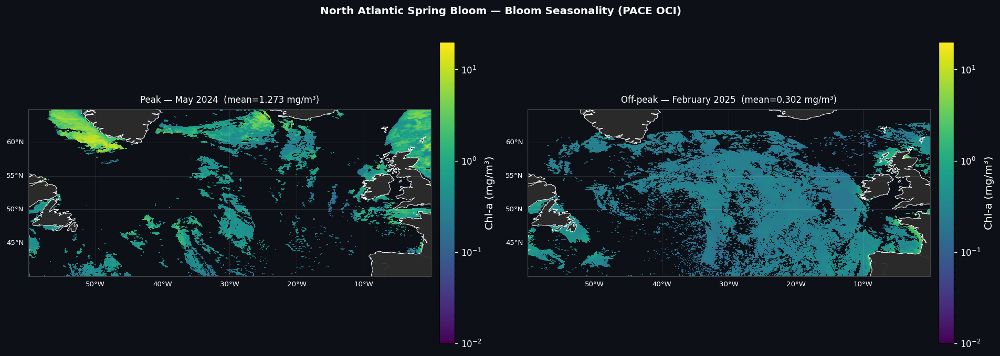

Saved -> figB_peakmap_north_atlantic.png

Gulf of Mexico:
  Coverage threshold : 21,083 px  (105,413 px best month)
  Eligible months    : 327/938
  Peak               : August 2024  (mean=1.851 mg/m³,  n=22,756)
  Off-peak           : September 2024  (mean=0.181 mg/m³,  n=28,126)


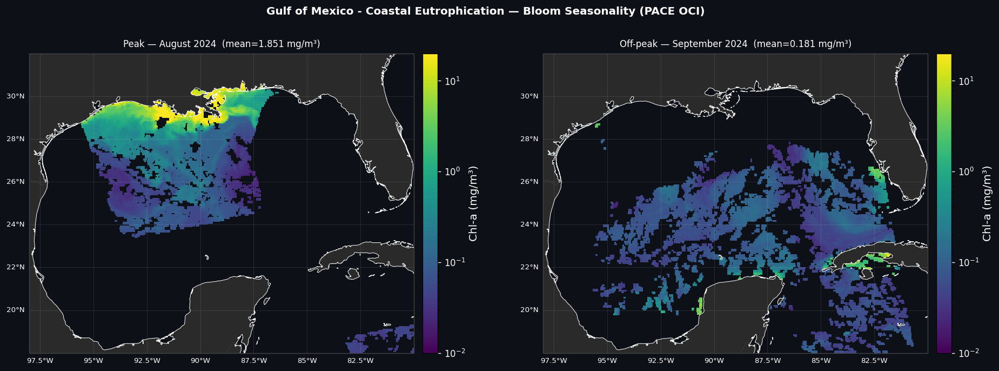

Saved -> figB_peakmap_gulf_of_mexico.png

Bay of Bengal:
  Coverage threshold : 30,555 px  (152,776 px best month)
  Eligible months    : 200/938
  Peak               : August 2024  (mean=0.813 mg/m³,  n=32,335)
  Off-peak           : May 2024  (mean=0.122 mg/m³,  n=39,273)


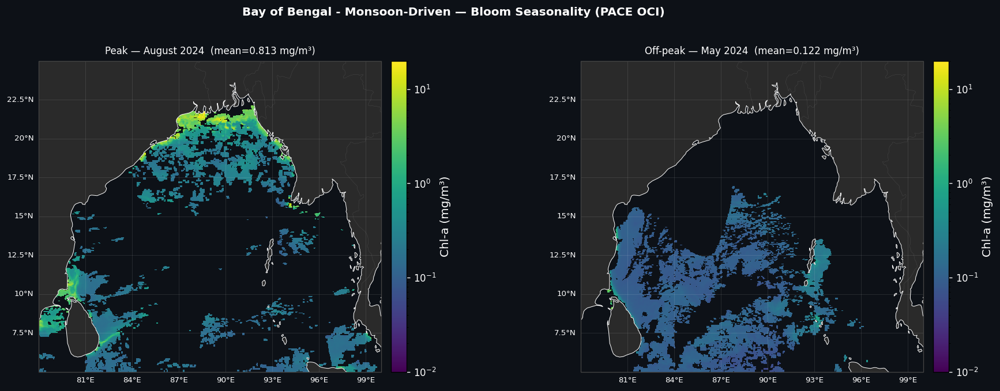

Saved -> figB_peakmap_bay_of_bengal.png

Southern Ocean:
  Coverage threshold : 274,472 px  (1,372,362 px best month)
  Eligible months    : 97/938
  Peak               : January 2025  (mean=0.433 mg/m³,  n=629,646)
  Off-peak           : August 2024  (mean=0.190 mg/m³,  n=398,989)


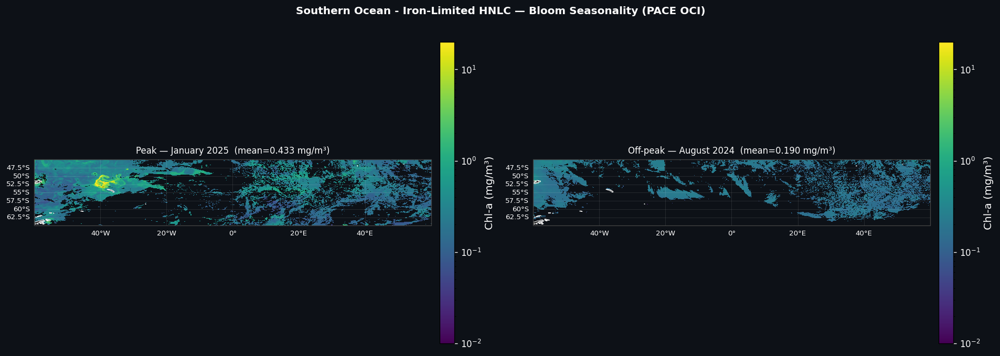

Saved -> figB_peakmap_southern_ocean.png

Equatorial Pacific:
  Coverage threshold : 358,514 px  (1,792,572 px best month)
  Eligible months    : 384/938
  Peak               : April 2024  (mean=0.277 mg/m³,  n=457,077)
  Off-peak           : September 2024  (mean=0.113 mg/m³,  n=400,144)


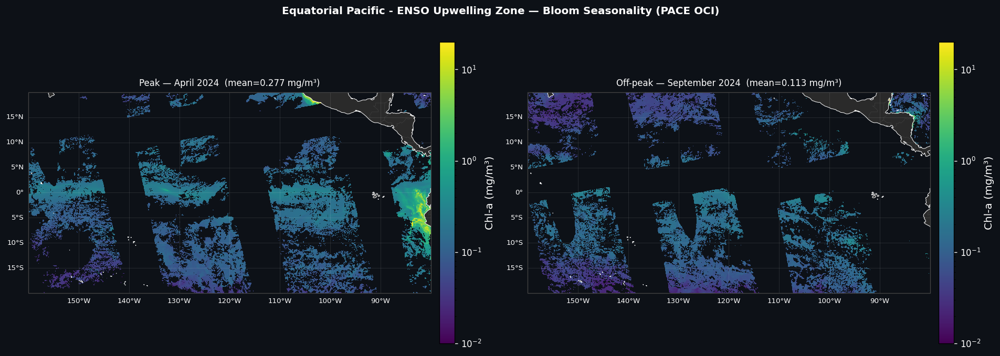

Saved -> figB_peakmap_equatorial_pacific.png


In [ ]:
# Peak vs. off-peak spatial maps with coverage gating
for region_name, rcfg in STUDY_REGIONS.items():
    means    = ts_stats[region_name]["means"]
    n_valid  = ts_stats[region_name]["n_valid"]
    extent   = rcfg["extent"]
    lon_min, lon_max, lat_min, lat_max = extent

    # Require at least 20% of the best-covered month's pixel count to be valid to
    # reduce a low pixel count to artificially inflate that month's mean and making it "peak."
    max_coverage = max((n for n in n_valid if n > 0), default=0)
    min_coverage = max_coverage * 0.20

    valid_means = [
        (m, i) for i, (m, n) in enumerate(zip(means, n_valid))
        if not np.isnan(m) and n >= min_coverage
    ]

    if len(valid_means) < 2:
        print(f"[{region_name}] Not enough well-covered months - skipping.")
        continue

    peak_idx   = max(valid_means, key=lambda x: x[0])[1]
    trough_idx = min(valid_means, key=lambda x: x[0])[1]

    # Print coverage info so you can see which months were eligible
    print(f"\n{region_name}:")
    print(f"  Coverage threshold : {min_coverage:,.0f} px  ({max_coverage:,.0f} px best month)")
    print(f"  Eligible months    : {len(valid_means)}/{len(ts_files)}")
    print(f"  Peak               : {ts_dates[peak_idx].strftime('%B %Y')}  (mean={means[peak_idx]:.3f} mg/m³,  n={n_valid[peak_idx]:,})")
    print(f"  Off-peak           : {ts_dates[trough_idx].strftime('%B %Y')}  (mean={means[trough_idx]:.3f} mg/m³,  n={n_valid[trough_idx]:,})")

    fig, axes = plt.subplots(1, 2, figsize=(16, 5.5),
                              subplot_kw={"projection": ccrs.PlateCarree()})
    fig.patch.set_facecolor("#0d1117")

    for ax, idx, tag in [
        (axes[0], peak_idx,   f"Peak - {ts_dates[peak_idx].strftime('%B %Y')}  (mean={means[peak_idx]:.3f} mg/m³)"),
        (axes[1], trough_idx, f"Off-peak - {ts_dates[trough_idx].strftime('%B %Y')}  (mean={means[trough_idx]:.3f} mg/m³)"),
    ]:
        chl_sub, ld, od = load_region(ts_files[idx], PACE_VAR, extent)

        # Extract 1D coordinate arrays
        lons_1d = chl_sub[od].values   # shape (n_lon,)
        lats_1d = chl_sub[ld].values   # shape (n_lat,)

        # Build 2D meshgrid so pcolormesh places every pixel correctly
        lons_2d, lats_2d = np.meshgrid(lons_1d, lats_1d)

        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
        ax.set_facecolor("#0d1117")
        ax.add_feature(cfeature.LAND,      facecolor="#2a2a2a", zorder=1)
        ax.add_feature(cfeature.COASTLINE, linewidth=0.6, edgecolor="white", zorder=2)
        ax.add_feature(cfeature.BORDERS,   linewidth=0.2, edgecolor="#555",  zorder=2)
        gl = ax.gridlines(draw_labels=True, linewidth=0.3, color="white", alpha=0.2,
                          x_inline=False, y_inline=False)
        gl.top_labels   = False
        gl.right_labels = False
        gl.xlabel_style = {"color": "white", "fontsize": 8}
        gl.ylabel_style = {"color": "white", "fontsize": 8}

        # Pass 2D meshgrid arrays - fixes the empty map
        im = ax.pcolormesh(lons_2d, lats_2d,
                           chl_sub.values,
                           norm=LogNorm(vmin=0.01, vmax=20), cmap="viridis",
                           transform=ccrs.PlateCarree(), shading="auto", zorder=0)

        cb = plt.colorbar(im, ax=ax, orientation="vertical", pad=0.02, fraction=0.04)
        cb.set_label("Chl-a (mg/m³)", color="white")
        cb.ax.yaxis.set_tick_params(color="white")
        plt.setp(cb.ax.yaxis.get_ticklabels(), color="white")

        ax.set_title(tag, color="white", fontsize=10, pad=7)
        for spine in ax.spines.values(): spine.set_edgecolor("#444")

    fig.suptitle(f"{rcfg['label']} - Bloom Seasonality (PACE OCI)",
                 fontsize=12, color="white", fontweight="bold", y=1.02)
    plt.tight_layout()
    safe_name = region_name.lower().replace(" ", "_")
    plt.savefig(f"figB_peakmap_{safe_name}.png", bbox_inches="tight", facecolor="#0d1117")
    plt.show()
    print(f"Saved -> figB_peakmap_{safe_name}.png")

#### Peak vs. Off-Peak Implications

The **North Atlantic** peak (May 2024) shows the bloom concentrated in the northwes, where shallow water depths and strong winter mixing pre-load nutrients, then spring stratification triggers rapid phytoplankton growth. The off-peak (February 2025) map is largely uniform and dim, confirming deep winter mixing suppresses productivity basin-wide.

The **Gulf of Mexico** peak (August 2024) highlights the northern shelf as the productivity hotspot, with a clear gradient from the nutrient-rich Mississippi outflow in the north to the oligotrophic open Gulf in the south. The off-peak (September 2024) map shows dramatically reduced coverage and values, partly late-summer stratification limiting nutrient supply and partly reduced satellite coverage from cloud cover.

The **Bay of Bengal** peak (August 2024) aligns with the summer southwest monsoon, when wind-driven mixing and river runoff from the Ganges and Brahmaputra deliver nutrients to the northern bay. The high Chl-a values (green/yellow) concentrated along the north and west coasts show river plume forcing. The off-peak (May 2024) represents the pre-monsoon dry season where there is low runoff and stable stratification that suppress productivity across the basin.

The **Southern Ocean** peak (January 2025) reflects the austral summer window when sea ice retreats and continuous daylight fuels phytoplankton growth. Even at peak, values remain a moderate values (mean 0.433 mg/m³), confirming iron limitation caps productivity despite abundant macronutrients. The off-peak (August 2024) map is nearly bare, showing that austral winter darkness and sea ice cover prevent any meaningful production.

The **Equatorial Pacific** peak (April 2024) and off-peak (September 2024) show modest contrast in mean values (0.277 vs 0.113 mg/m³) but the spatial pattern shows higher productivity is consistently anchored along the  equatorial upwelling band and the eastern boundary currents near the Central American coast. In this area trade winds drive cold, nutrient-rich water to the surface regardless of season. As mentioned earlier, the diagonal gaps visible in both panels are PACE orbit artifacts, not missing data.